In [2]:
import pandas as pd
import numpy as np
from math import ceil

# plotting
import matplotlib.pyplot as plt
#import seaborn as sns

# handling trajectory and other geo-data
import geopandas as gpd
#import movingpandas as mpd
from shapely.geometry import Point, LineString, Polygon

# Some filepaths
points_file = '../Data/gbg_trajectories_points_2019.csv'
trajs_file = '../Data/gbg_trajectories_2019_crossing.csv'
points_pickle_file = '../Data/points.pkl'
trajs_pickle_file = '../Data/trajectories.pkl'

Chalmers bought commercial datasets of mobile phone location data for research purposes. The data consists of around five billion data points from June to December in 2019, from devices that were in Sweden at least once (Gothenburg?) during this period. Our supervisor pre-processed this data to anonymize it and to extract *stops* and *trajectories*. 

In exploring the possibility of estimating traffic flow and speed it is the trajectory-data that is interesting. The original trajectory-data consisted only of the geometry for the trajectory line and aggregates for speed, duration, and distance for the entire trajectory. To be able to properly analyze flow and speed on specific road segments, our supervisor supplied us with a new dataset consisting of timestamped locations belonging to a trajectory id. Both datasets were also reduced greatly in size by only including trajectories that intersect Gothenburg municipality (city?) borders.


# Load data

In [3]:

#points_df = pd.read_csv('../Data/gbg_trajectories_points_2019.csv', nrows=1000, index_col='sid')
# read pickle data to dataframe
points_df = pd.read_pickle(points_pickle_file)
display(points_df.head())
trajs_df = pd.read_pickle(trajs_pickle_file)
display(trajs_df.head())

,,x,y,timestamp,trajectory_sid
,trajectory_sid,,,,
945076,1,323265.332049,6.417527e+06,2019-09-04 15:58:09+02:00,1
945077,1,323200.761503,6.417410e+06,2019-09-04 15:58:14+02:00,1
945078,1,323140.136125,6.417293e+06,2019-09-04 15:58:19+02:00,1
945079,1,323087.578794,6.417171e+06,2019-09-04 15:58:24+02:00,1
945080,1,323043.302414,6.417045e+06,2019-09-04 15:58:29+02:00,1


,start_time,stop_time,duration,data_points,distance,speed,line
sid,,,,,,,
1,2019-09-04 15:18:24+02:00,2019-09-04 16:03:24+02:00,2700,541,64885,86.513333,LINESTRING (342610.0375303831 6464707.88746338...
3,2019-10-19 18:55:00+02:00,2019-10-19 20:54:12+02:00,7152,1429,206390,103.887584,LINESTRING (324460.85687151505 6386857.1792007...
4,2019-10-28 04:13:07+01:00,2019-10-28 05:14:17+01:00,3670,648,96755,94.909537,LINESTRING (321475.2318731322 6398016.73146137...
7,2019-11-23 09:10:37+01:00,2019-11-23 10:06:47+01:00,3370,670,77225,82.495549,LINESTRING (329279.0401737231 6403344.89584320...
11,2019-09-16 18:05:00+02:00,2019-09-16 18:53:53+02:00,2933,507,75961,93.235459,LINESTRING (320825.56008272676 6399036.5784418...


In [4]:
trajs_df.info(), points_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2519482 entries, 1 to 9864767
Data columns (total 7 columns):
 #   Column       Dtype  
---  ------       -----  
 0   start_time   object 
 1   stop_time    object 
 2   duration     uint32 
 3   data_points  uint32 
 4   distance     uint32 
 5   speed        float64
 6   line         object 
dtypes: float64(1), object(3), uint32(3)
memory usage: 124.9+ MB
<class 'pandas.core.frame.DataFrame'>
MultiIndex: 13564236 entries, (945076, 1) to (552533, 9864767)
Data columns (total 4 columns):
 #   Column          Dtype  
---  ------          -----  
 0   x               float64
 1   y               float64
 2   timestamp       object 
 3   trajectory_sid  uint32 
dtypes: float64(2), object(1), uint32(1)
memory usage: 589.3+ MB


(None, None)

In [5]:
# export some trajectories to look at in QGIS
trajs_df.sample(100000).line.to_csv('../Data/trajectories_sample.csv', index=False)
points_df.sample(100000).to_csv('../Data/points_sample.csv', index=False)

# The trajectory data

In [6]:
print("The data contains {} rows and {} columns.".format(trajs_df.shape[0], trajs_df.shape[1]))
print("These are the column names: {}".format(trajs_df.columns.values))
print("Here is a small sample of the data:")
trajs_df.sample(15)

The data contains 2519482 rows and 7 columns.
These are the column names: ['start_time' 'stop_time' 'duration' 'data_points' 'distance' 'speed'
 'line']
Here is a small sample of the data:


,start_time,stop_time,duration,data_points,distance,speed,line
sid,,,,,,,
1702694,2019-10-08 09:32:30+02:00,2019-10-08 09:32:33+02:00,3,2,4,4.800000,LINESTRING (316768.2021021033 6402773.67609523...
8314585,2019-06-13 18:59:36+02:00,2019-06-13 18:59:42+02:00,6,2,6,3.600000,LINESTRING (323317.5108192102 6404623.34372163...
5621635,2019-07-18 16:03:29+02:00,2019-07-18 16:04:01+02:00,32,4,701,78.862500,LINESTRING (322832.16462736716 6392045.3371938...
2541240,2019-08-09 08:10:56+02:00,2019-08-09 08:11:02+02:00,6,2,7,4.200000,LINESTRING (322676.8111163125 6405139.19774204...
847069,2019-10-20 11:26:30+02:00,2019-10-20 12:07:38+02:00,2468,2,673,0.981686,LINESTRING (315877.36604440666 6396919.3231243...
1677516,2019-10-09 10:25:48+02:00,2019-10-09 10:25:52+02:00,4,2,6,5.400000,LINESTRING (319458.0330110148 6399042.44794391...
7127615,2019-08-26 22:40:28+02:00,2019-08-26 22:57:01+02:00,993,2,917,3.324471,LINESTRING (317558.0988129532 6402542.58701280...
1844976,2019-12-25 13:05:57+01:00,2019-12-25 13:10:59+01:00,302,3,709,8.451656,LINESTRING (323933.8540291949 6406309.64390150...
9345329,2019-06-19 20:54:01+02:00,2019-06-19 20:54:32+02:00,31,3,31,3.600000,LINESTRING (322029.50742827926 6402762.5826113...


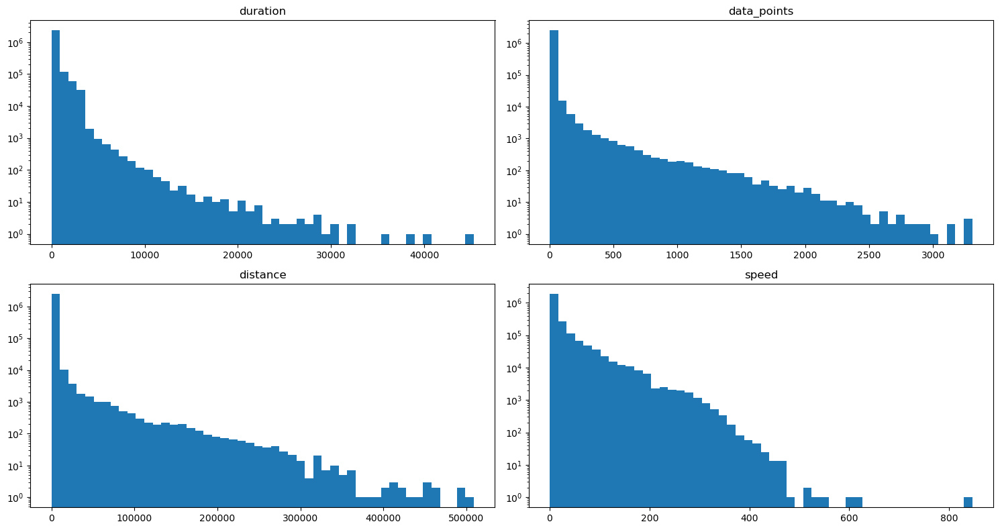

In [7]:

# plot and explore what data to clean
variables = ['duration', 'data_points', 'distance', 'speed']
num_cols = 2
num_rows = ceil(len(variables) / num_cols)

fig, axes = plt.subplots(num_rows, num_cols, sharex=False, sharey=False, figsize=(15, 4 * num_rows))
axes = axes.flatten()

for i, var_name in enumerate(variables):
    axes[i].hist(trajs_df[var_name], bins=50, log=True)
    axes[i].set_title(var_name)

# delete empty plots
for i in range(len(variables), len(axes)):
    fig.delaxes(axes[i])  


plt.tight_layout()
plt.show()


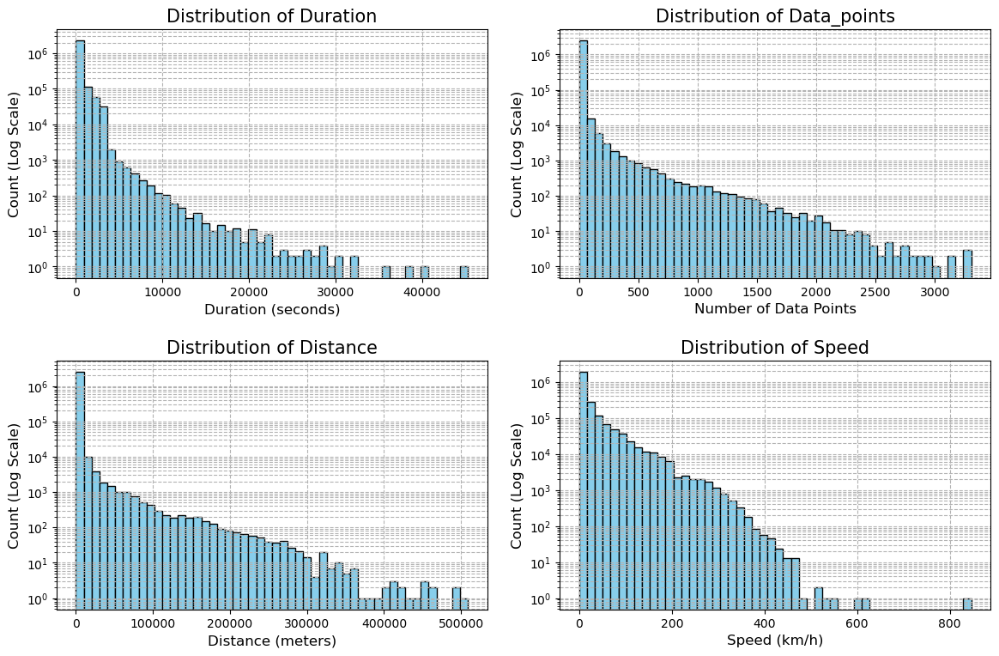

In [8]:
# Prepare variables and configuration
variables = ['duration', 'data_points', 'distance', 'speed']
labels = {
    'duration': 'Duration (seconds)',
    'data_points': 'Number of Data Points',
    'distance': 'Distance (meters)',
    'speed': 'Speed (km/h)'
}
num_cols = 2
num_rows = int(np.ceil(len(variables) / num_cols))

fig, axes = plt.subplots(num_rows, num_cols, sharex=False, sharey=False,
                         figsize=(12, 4 * num_rows))
axes = axes.ravel()

# Iterate over variables and plot histograms
for i, var_name in enumerate(variables):
    data = trajs_df[var_name]
    
    # Remove non-finite values like NaNs or infs before plotting
    data = data[np.isfinite(data)]
    
    axes[i].hist(data, bins=50, log=True, color='skyblue', edgecolor='black')
    axes[i].set_title(f'Distribution of {var_name.capitalize()}', fontsize=15)
    axes[i].set_xlabel(labels[var_name], fontsize=12)
    axes[i].set_ylabel('Count (Log Scale)', fontsize=12)
    axes[i].grid(True, which="both", ls="--", c='0.7')

# Remove unused subplots
for i in range(len(variables), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout(pad=2.0)
plt.savefig('figures/trajectories_variables_histograms.png')
plt.show()

There are some extreme speeds and distances. We will take a closer look at these.

# Speed

Speed is tricky. We will explore the trajectories with average speed above 200km/h by plotting them in QGIS. Visually they all seem irrelevant or erroneous at first glance, and even if some trajectories cross our road sections and are actual traffic, they are outliers that skew our speed estimations. 

In [9]:
trajs_df[trajs_df.speed == trajs_df.speed.max()]

,start_time,stop_time,duration,data_points,distance,speed,line
sid,,,,,,,
6090494,2019-08-02 07:22:56+02:00,2019-08-02 07:23:00+02:00,4,3,940,846.0,LINESTRING (317219.15317020565 6384036.4590754...


In [10]:
trajs_df[trajs_df.speed == trajs_df.speed.max()].line.to_csv('../Data/max_speed.csv', index=False)

In [11]:
trajs_df.index.min()


1

In [12]:
trajs_df.query('speed > 846').describe()

,duration,data_points,distance,speed
count,0.0,0.0,0.0,0.0
mean,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN
max,NaN,NaN,NaN,NaN


These trajectories are obviously erroneous and as such is deleted.

In [13]:
trajs_df = trajs_df[trajs_df.speed < 846]

In [14]:
trajs_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2519481 entries, 1 to 9864767
Data columns (total 7 columns):
 #   Column       Dtype  
---  ------       -----  
 0   start_time   object 
 1   stop_time    object 
 2   duration     uint32 
 3   data_points  uint32 
 4   distance     uint32 
 5   speed        float64
 6   line         object 
dtypes: float64(1), object(3), uint32(3)
memory usage: 124.9+ MB


In [15]:
trajs_df.query('speed > 100 & data_points > 2')

,start_time,stop_time,duration,data_points,distance,speed,line
sid,,,,,,,
3,2019-10-19 18:55:00+02:00,2019-10-19 20:54:12+02:00,7152,1429,206390,103.887584,LINESTRING (324460.85687151505 6386857.1792007...
21,2019-10-26 09:27:12+02:00,2019-10-26 10:19:26+02:00,3134,616,87060,100.005105,LINESTRING (339446.71106756444 6327625.7908899...
42,2019-10-21 08:11:33+02:00,2019-10-21 09:29:16+02:00,4663,925,157115,121.298306,LINESTRING (319400.0214121169 6400613.28769471...
1146,2019-09-12 15:34:55+02:00,2019-09-12 15:35:26+02:00,31,3,1665,193.354839,LINESTRING (320351.954871995 6411196.181892004...
1147,2019-09-12 15:35:45+02:00,2019-09-12 15:37:44+02:00,119,6,4161,125.878992,LINESTRING (320351.954871995 6411196.181892004...
...,...,...,...,...,...,...,...
9864677,2019-09-20 15:26:03+02:00,2019-09-20 15:30:39+02:00,276,54,9854,128.530435,LINESTRING (322676.92437875125 6414261.0070505...
9864706,2019-10-26 16:31:20+02:00,2019-10-26 17:29:59+02:00,3519,700,109949,112.479795,LINESTRING (368377.00897838664 6296030.8263878...
9864756,2019-09-21 17:32:11+02:00,2019-09-21 18:21:25+02:00,2954,575,87786,106.983615,LINESTRING (333231.17443553626 6398895.0599213...


## Points data

In [16]:
print("The data contains {} rows and {} columns.".format(points_df.shape[0], points_df.shape[1]))
print("These are the column names: {}".format(points_df.columns.values))
print("Here is a small sample of the data:")
points_df.sample(15)

The data contains 13564236 rows and 4 columns.
These are the column names: ['x' 'y' 'timestamp' 'trajectory_sid']
Here is a small sample of the data:


,,x,y,timestamp,trajectory_sid
,trajectory_sid,,,,
7745387,6108897,332587.736599,6.403374e+06,2019-07-22 13:47:28+02:00,6108897
4274417,2933814,320932.475758,6.404867e+06,2019-08-13 00:28:37+02:00,2933814
4292537,2944845,321776.568670,6.405666e+06,2019-08-30 06:42:43+02:00,2944845
10957520,8833086,316454.003744,6.411024e+06,2019-06-27 20:14:58+02:00,8833086
3037406,1447531,314825.839397,6.392783e+06,2019-10-12 17:12:20+02:00,1447531
11362028,9228972,315715.898090,6.394140e+06,2019-06-01 14:36:40+02:00,9228972
12208845,1842999,310532.236233,6.400325e+06,2019-12-11 14:01:27+01:00,1842999
10170596,8137318,320984.847412,6.403459e+06,2019-08-10 20:33:08+02:00,8137318
5493675,4077518,322000.745292,6.401305e+06,2019-08-08 10:11:12+02:00,4077518


Removing segments that are unrealistic even if map-matched. For example 999 meters in 1 second. 

Travelling 200km/h in a city is not realistic, but if that is a straight line across the city and the path actually taken is four times as long, then it is not as unrealistic. 

Also thinking of what is useful for us. Maybe 1000 meters already is too long for a segment. No actually, Skånegatan is even longer than that, roughly 1.1km.

Add columns
* geometry (via geopandas)
* day, month, year, hour, 20-min-interval?
* speed
* direction
* angular momentum?
* 


In [17]:
points_df.sort_values(by=['trajectory_sid', 'timestamp'], inplace=True)

ValueError: 'trajectory_sid' is both an index level and a column label, which is ambiguous.

In [ ]:
geo_points_df = gpd.GeoDataFrame(points_df, geometry=gpd.points_from_xy(points_df.x, points_df.y), crs = 'EPSG:3006') # don't forget crs = 'EPSG:3006'
geo_points_df.head()

,x,y,timestamp,trajectory_sid,geometry
0,323394.195869,6.407899e+06,2019-11-06 15:03:47+01:00,161,POINT (323394.196 6407898.757)
1,323562.224330,6.408020e+06,2019-11-06 14:20:50+01:00,161,POINT (323562.224 6408019.820)
2,323550.592833,6.408006e+06,2019-09-06 20:50:31+02:00,26,POINT (323550.593 6408006.083)
3,323856.627713,6.408320e+06,2019-09-06 20:50:50+02:00,26,POINT (323856.628 6408320.196)
4,323495.056467,6.408011e+06,2019-09-06 20:52:09+02:00,26,POINT (323495.056 6408010.748)


In [ ]:
# it seems really weird but I have to convert the timestamps to UTC then back... I will test it with a sample first
geo_sample = geo_points_df.sample(100000)

In [ ]:
geo_sample['timestamp'] = pd.to_datetime(geo_sample['timestamp'], utc=True)
print("To UTC done.")
geo_sample['timestamp'] = geo_sample['timestamp'].dt.tz_convert('Europe/Stockholm')
print("To Stockholm done.")
geo_sample.sample(10)

To UTC done.
To Stockholm done.


,x,y,timestamp,trajectory_sid,geometry
9570760,317249.190852,6.395273e+06,2019-08-30 05:58:55+02:00,11902738,POINT (317249.191 6395273.452)
6721737,326550.246942,6.395236e+06,2019-07-30 10:55:03+02:00,5474329,POINT (326550.247 6395236.146)
12085532,315345.393278,6.423977e+06,2019-08-29 15:20:33+02:00,17087559,POINT (315345.393 6423976.686)
5889959,314795.525858,6.402511e+06,2019-06-02 19:15:52+02:00,3622088,POINT (314795.526 6402510.848)
13529023,320498.239279,6.400176e+06,2019-08-04 11:46:17+02:00,20068084,POINT (320498.239 6400175.775)
5829735,317630.865868,6.439050e+06,2019-08-06 10:22:01+02:00,3460467,POINT (317630.866 6439049.839)
17402689,326614.522751,6.401600e+06,2019-12-30 13:17:49+01:00,2103258,POINT (326614.523 6401599.789)
3866213,323346.629940,6.407823e+06,2019-09-15 17:10:31+02:00,5573196,POINT (323346.630 6407823.066)
1650261,319728.732498,6.401059e+06,2019-09-13 14:54:50+02:00,2360989,POINT (319728.732 6401059.234)
909303,323669.888516,6.405612e+06,2019-10-13 18:21:40+02:00,1245643,POINT (323669.889 6405611.762)


In [ ]:
geo_points_df.iloc[909303]

x                                               323669.888516
y                                              6405611.761592
timestamp                           2019-10-13 18:21:40+02:00
trajectory_sid                                        1245643
geometry          POINT (323669.8885163792 6405611.761592067)
Name: 909303, dtype: object

In [ ]:
# timestamps seem fine, let's convert the whole dataframe
geo_points_df['timestamp'] = pd.to_datetime(geo_points_df['timestamp'], utc=True)
print("To UTC done.")
geo_points_df['timestamp'] = geo_points_df['timestamp'].dt.tz_convert('Europe/Stockholm')
print("To Stockholm done.")


To UTC done.
To Stockholm done.


In [ ]:
trajs_df = mpd.TrajectoryCollection(geo_points_df, traj_id_col = 'trajectory_sid', t='timestamp', crs='epsg:3006')


c:\Users\ander\AppData\Local\Programs\Python\Python310\lib\site-packages\movingpandas\trajectory.py:138: TimeZoneWarning: Time zone information dropped from trajectory. All dates and times will use local time. This is applied by doing df.tz_localize(None). To use UTC or a different time zone, convert and drop time zone information prior to trajectory creation.
  warnings.warn(
c:\Users\ander\AppData\Local\Programs\Python\Python310\lib\site-packages\movingpandas\trajectory.py:166: MissingCRSWarning: Trajectory generated without CRS. Computations will use Euclidean distances.
  warnings.warn(
c:\Users\ander\AppData\Local\Programs\Python\Python310\lib\site-packages\movingpandas\trajectory.py:138: TimeZoneWarning: Time zone information dropped from trajectory. All dates and times will use local time. This is applied by doing df.tz_localize(None). To use UTC or a different time zone, convert and drop time zone information prior to trajectory creation.
  warnings.warn(
c:\Users\ander\AppData

KeyboardInterrupt: 

MovingPandas får slänga sig i väggen så tar vi o gör egen Trajectory class. 